# OpenCV + MIGraphX + VLM: Zero-Host-Copy, Step by Step

The central question is not whether every component can use a GPU. It is whether
large image pixels and model tensors can cross framework boundaries **without using
Host RAM as the interchange format**.

This notebook first defines the architecture and its contracts, then maps every
experiment to one node in the design. It also labels validation-only host copies
and the standard JPEG VLM baseline so they are not mistaken for zero-host-copy evidence.

## 0.1 What “zero-host-copy inference path” means here

**Required invariant:** from the rocDecode GPU surface through OpenCV HIP and
MIGraphX, a full frame, ROI, or model-input tensor is not downloaded to Host RAM
only to be uploaded again by the next framework.

**Allowed operations:**

- GPU-to-GPU resize, HWC→CHW conversion, contiguous packing, and IPC packing;
- transferring shape, stride, device pointers, stream identifiers, and a 64-byte IPC handle;
- downloading the small set of surviving NMS boxes for the current CPU overlay;
- explicit D2H copies used only by validation cells to compare against a CPU reference.

This is therefore **zero host round-trip for the inference hot path**, not “zero
memory movement of any kind.”

## 0.2 Two inference branches on the same GPU

“Two branches” means two logical data paths, **not two physical GPUs**. This
notebook uses one Radeon GPU: `device_id=0` in the pipeline, `cuda:0` in
PyTorch, and `ROCm0` in llama.cpp. Both architecture branches start from the
same decoded frame on that device.

```text
Single Radeon GPU (device 0: cuda:0 / ROCm0)
        │
        ▼
rocDecode VRAM surface
        │ DLPack: pointer + shape + stride
        ▼
Torch RGB GPU tensor (memory owner / interoperability carrier)
        │
        ├── Detection branch ───────────────────────────────────────────┐
        │   non-owning GpuMat view -> OpenCV HIP letterbox/normalize    │
        │   -> Torch GPU blob -> MIGraphX argument_from_pointer()       │
        │   -> resident output -> cv::cuda::nms                         │
        │   -> only surviving boxes copied to host                      │
        │                                                               │
        └── VLM IPC branch ─────────────────────────────────────────────┐
            GPU ROI -> OpenCV HIP smart_resize/pad/normalize            │
            -> hipMemcpy2D D2D into packed independent hipMalloc        │
            -> 64-byte HIP IPC handle -> same-GPU patched llama.cpp     │
```

![Zero-host-copy architecture](assets/zero_host_copy_architecture_cn.png)

## 0.3 Five contracts make pointer interoperability safe

| Contract | What this package enforces | Failure mode |
|---|---|---|
| **Device** | decoder, OpenCV, MIGraphX, and IPC server use the same physical Radeon GPU | handle maps on the wrong device |
| **Layout** | shape/stride are explicit; HWC→CHW stays on GPU; IPC rows are packed tightly | wrong colors, out-of-bounds access, invalid model tensor |
| **Ownership** | Torch or dedicated `hipMalloc` owns memory; OpenCV uses non-owning views | memory is freed while a view still uses it |
| **Synchronization** | MIGraphX uses the current HIP stream; IPC export synchronizes completed writes | downstream reads unfinished data |
| **Lifetime** | async work retains a frame clone; IPC buffer lives until the server request returns | decoder reuse or early `hipFree` creates a dangling pointer |

Numerical semantics are part of the layout contract: the IPC branch uses
`resize(..., align_corners=True)` so GPU preprocessing matches the patched
llama.cpp reference path before the server skips its own CPU preprocessing.

## 0.4 Evidence map for the cells below

| Notebook section | Architecture node | Evidence level |
|---|---|---|
| rocDecode | compressed bitstream → GPU RGB tensor | **Hot-path evidence**; validation cell adds an explicit comparison D2H |
| OpenCV HIP preprocessing | external pointer `GpuMat` → GPU FP32 blob | **Hot-path evidence**; CPU comparison is validation-only |
| MIGraphX + GPU NMS | device pointer → resident output → survivor metadata | **Hot-path evidence** |
| HIP-IPC packaging | GPU ROI → packed buffer → 64-byte handle | **Client-side evidence**; no HTTP request is sent in this notebook |
| llama.cpp descriptions | ordinary JPEG/OpenAI-compatible endpoint | **Semantic baseline, not IPC evidence** |
| overlay and packaged video | CPU drawing + VA-API `hwupload` | **Known Host boundary** |

The patched `preprocessed-IPC` llama.cpp server is required to complete the VLM
zero-host-copy branch. The standard server used for the reproducible Q8_0 baseline
does not consume the exported handle.

## 1. Check the environment and prepare models

In [ ]:
import importlib
import os
import sys
from pathlib import Path


def find_package_root() -> Path:
    origins = [Path.cwd(), *(Path(value) for value in sys.path if value)]
    candidates = []
    for origin in origins:
        candidates.extend((origin, *origin.parents))
    for candidate in candidates:
        if (
            (candidate / "scripts/notebook_env.py").is_file()
            and (candidate / "src").is_dir()
            and (candidate / "data").is_dir()
        ):
            return candidate.resolve()
    raise FileNotFoundError("Run this notebook from the opencv_amd_end2end folder")


ROOT = find_package_root()
os.environ["OPENCV_AMD_END2END_ROOT"] = str(ROOT)
os.environ["OPENCV_AMD_END2END_MODEL_DIR"] = str(ROOT / "models")
os.environ["OPENCV_AMD_END2END_OUTPUT_DIR"] = str(ROOT / "output")
(ROOT / "models").mkdir(parents=True, exist_ok=True)
(ROOT / "output").mkdir(parents=True, exist_ok=True)
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

from scripts import notebook_env as env
env = importlib.reload(env)
from scripts.notebook_helpers import frame_at, show_bgr, show_bgr_grid, video_info

print(env.package_layout())

os.environ.setdefault("HF_ENDPOINT", "https://hf-mirror.com")

import shutil
import cv2
import migraphx
import pandas as pd
import torch
from IPython.display import display
from scripts.model_setup import ensure_models, model_status

free_gib = shutil.disk_usage(env.MODELS).free / 1024**3
environment = {
    "python": sys.executable,
    "opencv": cv2.__version__,
    "opencv_hip_devices": cv2.cuda.getCudaEnabledDeviceCount(),
    "torch": torch.__version__,
    "torch_gpu": torch.cuda.get_device_name(0) if torch.cuda.is_available() else None,
    "gpu_arch": torch.cuda.get_device_properties(0).gcnArchName if torch.cuda.is_available() else None,
    "migraphx": migraphx.__file__,
    "models_directory": str(env.MODELS),
    "models_free_gib": round(free_gib, 2),
    "hf_endpoint": os.environ["HF_ENDPOINT"],
}
display(pd.Series(environment, name="value").to_frame())
assert environment["opencv_hip_devices"] >= 1
assert torch.cuda.is_available()

print("Model status before preparation:")
display(pd.DataFrame(model_status(env.MODELS)))

# Missing Qwen files download here. One fixed HTML progress area updates in place.
models = ensure_models(
    model_dir=env.MODELS,
    endpoint=os.environ["HF_ENDPOINT"],
    progress=True,
)
print("Model status after preparation:")
display(pd.DataFrame(models))

## 2. Start and validate the inference runtime

After the download completes, the companion llama.cpp service detects the GGUF
files and loads Qwen3-VL. This cell displays service startup progress, then checks
OpenCV HIP, PyTorch ROCm, MIGraphX, all four model files, and multimodal support.

In [2]:
from scripts.model_setup import wait_for_llamacpp
from scripts.validate_runtime import validate

service_models = wait_for_llamacpp(timeout=600, progress=True)
print("llama.cpp model:", service_models["data"][0]["id"])
runtime = validate(require_models=True, require_vlm=True)
runtime

llama.cpp model: /models/Qwen3-VL-8B-Instruct-Q8_0.gguf


{'root': '/workspace',
 'src': '/workspace/src',
 'data': '/workspace/data',
 'models': '/workspace/models',
 'output': '/workspace/output',
 'opencv_install': '/opt/opencv5',
 'llamacpp': 'http://opencv_amd_end2end_llamacpp:8199/v1',
 'python': '/opt/venv/bin/python3',
 'opencv': '5.1.0-dev',
 'opencv_hip_devices': 1,
 'torch': '2.9.1+gitff65f5b',
 'torch_gpu': 'AMD Radeon PRO W7900D',
 'gpu_arch': 'gfx1100',
 'migraphx': '/opt/rocm/lib/migraphx.cpython-310-x86_64-linux-gnu.so',
 'vlm_model': '/models/Qwen3-VL-8B-Instruct-Q8_0.gguf',
 'vlm_capabilities': ['completion', 'multimodal']}

## 3. Source video

In [3]:
from IPython.display import Video, display

env.require_files(env.SOURCE_VIDEO)
source_info = video_info(env.SOURCE_VIDEO)
print(source_info)
display(Video(str(env.SOURCE_VIDEO), embed=True, html_attributes='controls style="width:100%;max-width:960px"'))

{'width': 1920, 'height': 1080, 'fps': 25.0, 'frames': 393, 'duration_seconds': 15.72}


## 4. Checkpoint A — rocDecode to DLPack GPU memory

**Architecture mapping:** rocDecode exposes its RGB surface through DLPack;
PyTorch becomes the lifetime owner/interoperability carrier. Shape and stride
are part of the layout contract, not incidental metadata.

The detection path continues from `rgb_gpu`. The `.cpu().numpy()` below is an
explicit **validation-only D2H branch**; it is not an input to GPU preprocessing.

[ERR]  {GetWidth}  Display width is 0.
[ERR]  {GetHeight}  Display height is 0.
amdgpu: os_same_file_description couldn't determine if two DRM fds reference the same file description.
If they do, bad things may happen!


hot-path tensor: {'device': 'cuda:0', 'device_index': 0, 'pointer': '0x78cc7e3ed600', 'shape': (1080, 1920, 3), 'stride': (5760, 3, 1), 'dtype': 'torch.uint8', 'contiguous': True}
validation-only rocDecode vs CPU MAE: 0.5657868762860082


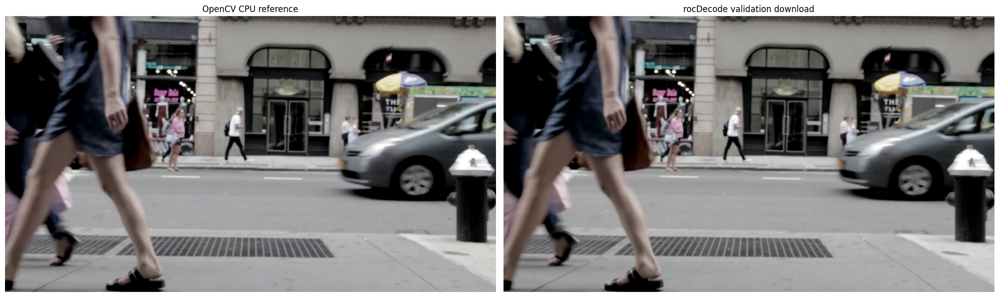

In [4]:
import cv2
import numpy as np
from video_io import RocDecodeReader

FRAME_INDEX = 50
capture = cv2.VideoCapture(str(env.SOURCE_VIDEO))
capture.set(cv2.CAP_PROP_POS_FRAMES, FRAME_INDEX)
ok, cpu_bgr = capture.read()
capture.release()
assert ok
cpu_rgb = cv2.cvtColor(cpu_bgr, cv2.COLOR_BGR2RGB)

reader = RocDecodeReader(str(env.SOURCE_VIDEO), device_id=0)
for _ in range(FRAME_INDEX + 1):
    ok, rgb_gpu = reader.read_gpu()
    assert ok
reader.release()

# Hot-path evidence: keep this tensor in VRAM for the following checkpoints.
decode_gpu_pointer = rgb_gpu.data_ptr()
decode_evidence = {
    "device": str(rgb_gpu.device),
    "device_index": rgb_gpu.device.index,
    "pointer": hex(decode_gpu_pointer),
    "shape": tuple(rgb_gpu.shape),
    "stride": rgb_gpu.stride(),
    "dtype": str(rgb_gpu.dtype),
    "contiguous": rgb_gpu.is_contiguous(),
}
print("hot-path tensor:", decode_evidence)
assert rgb_gpu.is_cuda and rgb_gpu.is_contiguous()
assert rgb_gpu.stride() == (cpu_bgr.shape[1] * 3, 3, 1)

# Validation branch only: this is the first full-frame D2H in the notebook.
rocdecode_rgb = rgb_gpu.cpu().numpy()
decode_mae = float(np.abs(
    rocdecode_rgb.astype(np.int16) - cpu_rgb.astype(np.int16)
).mean())
print("validation-only rocDecode vs CPU MAE:", decode_mae)
assert decode_mae < 2.0
show_bgr_grid(
    [cpu_bgr, cv2.cvtColor(rocdecode_rgb, cv2.COLOR_RGB2BGR)],
    ["OpenCV CPU reference", "rocDecode validation download"],
)

## 5. Checkpoint B — non-owning OpenCV view and GPU preprocessing

**Architecture mapping:** `GpuMat.fromDevicePointer` creates a non-owning view
over the Torch-owned rocDecode tensor. OpenCV HIP performs letterbox resize and
normalization in VRAM, then writes through another external `GpuMat` into
Torch-owned output memory. The final HWC→CHW contiguous conversion is a permitted
GPU-to-GPU copy.

Pointer equality proves the first hand-off does not allocate or copy image pixels.
The CPU reference comparison is validation-only and is not consumed by the detector.

In [5]:
import config
from preprocess import preprocess_frame_cpu, preprocess_frame_gpu_resident

# Recreate the same non-owning view used inside preprocess_frame_gpu_resident.
height, width = int(rgb_gpu.shape[0]), int(rgb_gpu.shape[1])
opencv_rgb_view = cv2.cuda_GpuMat.fromDevicePointer(
    rgb_gpu.data_ptr(), height, width, cv2.CV_8UC3, width * 3
)
opencv_view_pointer = opencv_rgb_view.cudaPtr()
print("Torch owner pointer:", hex(rgb_gpu.data_ptr()))
print("OpenCV view pointer:", hex(opencv_view_pointer))
assert opencv_view_pointer == rgb_gpu.data_ptr() == decode_gpu_pointer

blob_gpu, scale, pad_w, pad_h = preprocess_frame_gpu_resident(
    rgb_gpu, config.INPUT_SIZE
)
preprocess_evidence = {
    "input_pointer": hex(decode_gpu_pointer),
    "opencv_view_pointer": hex(opencv_view_pointer),
    "output_pointer": hex(blob_gpu.data_ptr()),
    "output_device": str(blob_gpu.device),
    "output_shape": tuple(blob_gpu.shape),
    "output_contiguous": blob_gpu.is_contiguous(),
}
print("hot-path preprocessing:", preprocess_evidence)
assert blob_gpu.is_cuda and blob_gpu.is_contiguous()
assert blob_gpu.device == rgb_gpu.device

# Validation branch only: compare the GPU result with the CPU implementation.
rocdecode_bgr = cv2.cvtColor(rocdecode_rgb, cv2.COLOR_RGB2BGR)
cpu_blob, cpu_scale, cpu_pad_w, cpu_pad_h = preprocess_frame_cpu(rocdecode_bgr)
preprocess_error = np.abs(blob_gpu.cpu().numpy().astype(np.float64) - cpu_blob.astype(np.float64))
print("scale / padding:", scale, pad_w, pad_h)
print("validation-only max CPU/GPU error:", float(preprocess_error.max()))
assert (scale, pad_w, pad_h) == (cpu_scale, cpu_pad_w, cpu_pad_h)
assert float(preprocess_error.max()) < 1e-6

Torch owner pointer: 0x78cc7e3ed600
OpenCV view pointer: 0x78cc7e3ed600
hot-path preprocessing: {'input_pointer': '0x78cc7e3ed600', 'opencv_view_pointer': '0x78cc7e3ed600', 'output_pointer': '0x78cc7e9dc200', 'output_device': 'cuda:0', 'output_shape': (1, 3, 640, 640), 'output_contiguous': True}
scale / padding: 0.3333333333333333 0 140
validation-only max CPU/GPU error: 5.960464477539063e-08


## 6. Checkpoint C — MIGraphX device pointer and GPU NMS

**Architecture mapping:** `migraphx.argument_from_pointer` consumes the Torch GPU
blob directly. The compiled FP16 graph writes into a preallocated GPU output tensor.
Confidence filtering, coordinate mapping, and class-aware `cv::cuda::nms` remain
on device.

Only the NMS indices and surviving box/class/score values cross to the CPU. This
small control result is an allowed D2H transfer; no frame or model tensor does.

[detector] Trying MIGraphX GPU backend (zero-copy)...
[detector] Loaded compiled model in 1.11s
[detector] MIGraphX GPU (FP16, zero-copy) ready
hot-path detection: {'backend': 'migraphx', 'input_pointer_passed_to_migraphx': '0x78cc7e9dc200', 'resident_output_pointer': '0x78cde0400000', 'output_shape': (1, 300, 6), 'output_device': 'cuda:0', 'nms_candidates': 300, 'survivors_downloaded': 9}


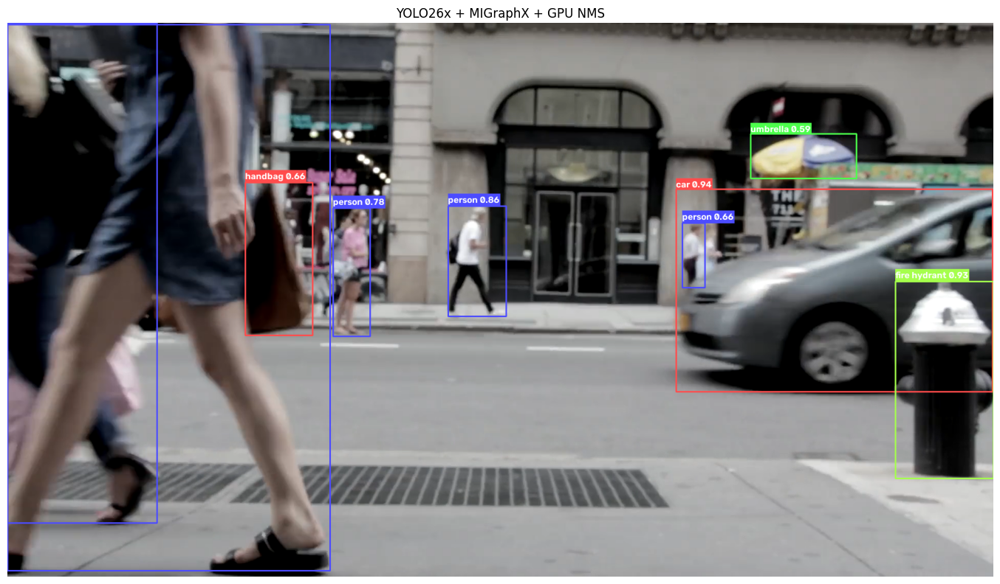

In [6]:
from detector import YOLODetector
from postprocess import draw_detections

assert config.YOLO_MODEL_PATH == str(env.YOLO_ONNX)
assert config.YOLO_COMPILED_PATH == str(env.YOLO_COMPILED)
detector = YOLODetector(device_id=0)
raw_gpu = detector._detect_migraphx_gpu_tensor(blob_gpu)
detections = detector._parse_gpu(
    raw_gpu, scale, pad_w, pad_h, rocdecode_bgr.shape
)
detect_evidence = {
    "backend": detector.backend,
    "input_pointer_passed_to_migraphx": hex(blob_gpu.data_ptr()),
    "resident_output_pointer": hex(raw_gpu.data_ptr()),
    "output_shape": tuple(raw_gpu.shape),
    "output_device": str(raw_gpu.device),
    "nms_candidates": int(raw_gpu.shape[1]),
    "survivors_downloaded": len(detections),
}
print("hot-path detection:", detect_evidence)
assert detector.backend == "migraphx"
assert tuple(raw_gpu.shape) == (1, 300, 6)
assert raw_gpu.is_cuda and raw_gpu.device == blob_gpu.device
assert raw_gpu.data_ptr() == detector._mgx_output_tensor.data_ptr()

# Presentation branch: boxes are already small host metadata at this point.
detection_overlay = rocdecode_bgr.copy()
draw_detections(detection_overlay, detections)
show_bgr(detection_overlay, "YOLO26x + MIGraphX + GPU NMS")

## 7. Branch point — one set of boxes, two VLM transports

The NMS survivors are small CPU metadata and can select regions in either memory
space. The previews below crop `rocdecode_bgr` only for display and for the
standard JPEG baseline in Section 9. Checkpoint D independently crops the original
`rgb_gpu` tensor; it does not reuse these host images.

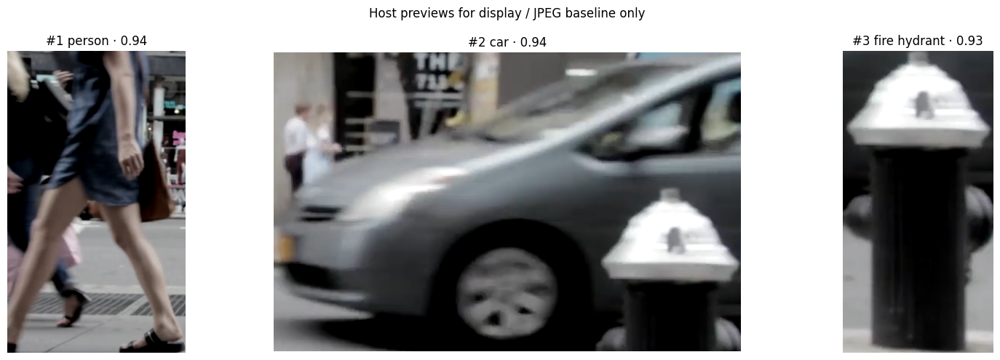

In [7]:
import matplotlib.pyplot as plt

sorted_detections = sorted(detections, key=lambda item: item[4], reverse=True)[:3]
assert sorted_detections
baseline_roi_items = []
for rank, detection in enumerate(sorted_detections, start=1):
    x1, y1, x2, y2 = [int(value) for value in detection[:4]]
    roi = rocdecode_bgr[max(0, y1):max(y1 + 1, y2), max(0, x1):max(x1 + 1, x2)]
    class_name = config.COCO_CLASSES[int(detection[5])]
    baseline_roi_items.append((rank, class_name, float(detection[4]), roi))

figure, axes = plt.subplots(1, len(baseline_roi_items), figsize=(18, 5))
for axis, (rank, name, score, roi) in zip(np.atleast_1d(axes), baseline_roi_items):
    axis.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
    axis.set_title(f"#{rank} {name} · {score:.2f}")
    axis.axis("off")
figure.suptitle("Host previews for display / JPEG baseline only")
figure.tight_layout()

## 8. Checkpoint D — GPU ROI preprocessing and HIP-IPC export

**Architecture mapping:** the top box indexes the original GPU frame. OpenCV HIP
runs Qwen3-VL `smart_resize`, pad, and normalization in VRAM. `IpcBuffer` then
uses `hipMemcpy2D` device-to-device to pack row-padded `GpuMat` data into a
dedicated, tightly packed `hipMalloc` allocation and exports its 64-byte handle.

The dedicated allocation satisfies layout and IPC offset requirements. Its
lifetime must extend until the consumer finishes reading it; this cell therefore
frees it only in `finally`. It deliberately sends no HTTP request. A complete
round-trip requires the custom `preprocessed-IPC` llama.cpp server on the same
physical GPU.

In [8]:
import torch
from gpu_ipc import IpcBuffer, preprocess_roi_gpu

frame_height, frame_width = int(rgb_gpu.shape[0]), int(rgb_gpu.shape[1])
x1, y1, x2, y2 = [int(value) for value in sorted_detections[0][:4]]
x1 = max(0, min(x1, frame_width - 1))
x2 = max(x1 + 1, min(x2, frame_width))
y1 = max(0, min(y1, frame_height - 1))
y2 = max(y1 + 1, min(y2, frame_height))

vlm_roi_gpu = rgb_gpu[y1:y2, x1:x2, :].contiguous()
vlm_width, vlm_height, vlm_gpu_f32 = preprocess_roi_gpu(vlm_roi_gpu)
ipc_buffer = IpcBuffer(vlm_gpu_f32)
try:
    packed_pointer = ipc_buffer._dptr.value
    ipc_evidence = {
        "device": str(vlm_roi_gpu.device),
        "roi_pointer": hex(vlm_roi_gpu.data_ptr()),
        "preprocessed_pointer": hex(vlm_gpu_f32.cudaPtr()),
        "preprocessed_size": (vlm_width, vlm_height),
        "preprocessed_step_bytes": int(vlm_gpu_f32.step),
        "packed_pointer": hex(packed_pointer),
        "packed_bytes": ipc_buffer.nbytes,
        "ipc_handle_bytes": len(ipc_buffer.handle),
        "ipc_handle_prefix": ipc_buffer.handle[:8].hex(),
        "http_request_sent": False,
    }
    print("client-side HIP-IPC evidence:", ipc_evidence)
    assert vlm_roi_gpu.is_cuda and vlm_roi_gpu.device == rgb_gpu.device
    assert torch.cuda.current_device() == (rgb_gpu.device.index or 0)
    assert ipc_buffer.nbytes == vlm_width * vlm_height * 3 * 4
    assert len(ipc_buffer.handle) == 64
    assert packed_pointer != vlm_gpu_f32.cudaPtr()
finally:
    ipc_buffer.free()

client-side HIP-IPC evidence: {'device': 'cuda:0', 'roi_pointer': '0x78cc7ee8c200', 'preprocessed_pointer': '0x78cc61400000', 'preprocessed_size': (640, 1056), 'preprocessed_step_bytes': 7680, 'packed_pointer': '0x78cc60a00000', 'packed_bytes': 8110080, 'ipc_handle_bytes': 64, 'ipc_handle_prefix': '0000a060cc780000', 'http_request_sent': False}


## 9. Semantic baseline — standard llama.cpp JPEG transport

This reproducible Q8_0 call is intentionally **not zero-host-copy evidence**.
`LlamaCppVLMClient` crops the host frame, JPEG-encodes each ROI, base64-encodes the
bytes, and submits them through the OpenAI-compatible endpoint. It verifies model
quality and the expected descriptions independently of the experimental IPC transport.

In [9]:
import time
from vlm_client import LlamaCppVLMClient

baseline_transport = "CPU ROI -> JPEG -> base64 -> HTTP -> llama.cpp"
print("transport:", baseline_transport)
client = LlamaCppVLMClient(base_url=env.LLAMACPP_BASE_URL, model_name="auto")
started = time.perf_counter()
vlm_results = client.describe_rois(rocdecode_bgr, detections, top_k=3)
vlm_seconds = time.perf_counter() - started
for detection, description in vlm_results:
    print(config.COCO_CLASSES[int(detection[5])], f"{detection[4]:.2f}", "->", description)
print("model:", client.model_name)
print("latency_seconds:", round(vlm_seconds, 3))
assert len(vlm_results) == 3
assert "Q8_0.gguf" in client.model_name
assert all(not description.startswith("[VLM error") for _, description in vlm_results)

transport: CPU ROI -> JPEG -> base64 -> HTTP -> llama.cpp
[llama.cpp] auto-resolved model: /models/Qwen3-VL-8B-Instruct-Q8_0.gguf
person 0.94 -> A blurred woman in a dark dress and sandals walks across a city street, her motion creating a dynamic, candid urban snapshot.
car 0.94 -> A blurry silver car is parked next to a fire hydrant on a city street, with pedestrians visible in the background.
fire hydrant 0.93 -> A blurry, black-and-white image of a fire hydrant with a white top and dark body, showing motion blur and low resolution.
model: /models/Qwen3-VL-8B-Instruct-Q8_0.gguf
latency_seconds: 0.74


## 10. Known Host boundary — CPU overlay and video encoding

The inference result is already complete before this presentation step. The
current canonical pipeline downloads one full RGB frame with
`rgb_gpu.cpu().numpy()` so standard CPU OpenCV can draw boxes and text. The
VA-API writer then converts the CPU frame and performs FFmpeg `hwupload` before
hardware encoding.

Those are real full-frame transfer boundaries. They are why this project claims
**zero-host-copy inference paths**, not absolute end-to-end zero-copy. This cell
reuses the earlier validation download rather than creating another transfer.

presentation boundary: {'input': 'host BGR frame (from the explicit validation D2H)', 'drawing': 'CPU OpenCV', 'video_writer': 'CPU BGR -> NV12 -> VA-API hwupload', 'part_of_zero_host_copy_claim': False}


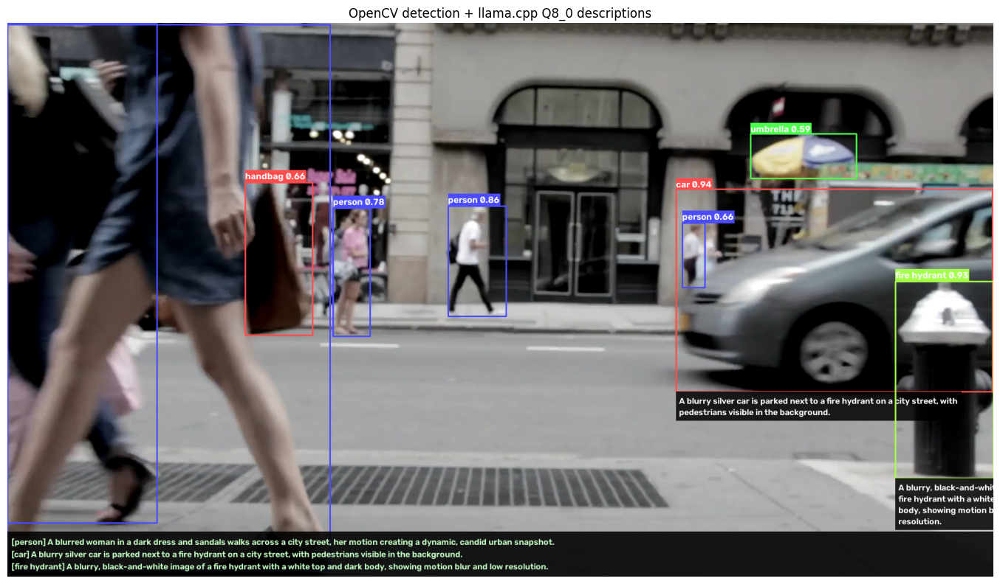

In [10]:
from postprocess import draw_scene_panel

overlay_boundary = {
    "input": "host BGR frame (from the explicit validation D2H)",
    "drawing": "CPU OpenCV",
    "video_writer": "CPU BGR -> NV12 -> VA-API hwupload",
    "part_of_zero_host_copy_claim": False,
}
print("presentation boundary:", overlay_boundary)
final_overlay = rocdecode_bgr.copy()
draw_detections(final_overlay, detections, vlm_results)
draw_scene_panel(final_overlay, vlm_results)
show_bgr(final_overlay, "OpenCV detection + llama.cpp Q8_0 descriptions")

## 11. Copy audit — what the notebook proved

The audit distinguishes data location from transfer type. “No Host pixels” does
not mean “no copy”: HWC→CHW materialization and IPC row packing are deliberate
GPU-to-GPU copies. The decisive property is that Host RAM is not the interchange
buffer for the inference branches.

In [11]:
copy_audit = pd.DataFrame([
    {
        "checkpoint": "A. rocDecode -> Torch",
        "large_data_location": "GPU",
        "transfer": "DLPack view / repaired GPU tensor",
        "host_pixels": "No (hot path)",
        "evidence": f"{decode_evidence['pointer']}, stride={decode_evidence['stride']}",
    },
    {
        "checkpoint": "B. Torch -> OpenCV HIP",
        "large_data_location": "GPU",
        "transfer": "non-owning pointer view + GPU ops",
        "host_pixels": "No (hot path)",
        "evidence": f"pointer equality={opencv_view_pointer == decode_gpu_pointer}",
    },
    {
        "checkpoint": "C. OpenCV -> MIGraphX -> NMS",
        "large_data_location": "GPU",
        "transfer": "device pointer; small survivor D2H",
        "host_pixels": "No",
        "evidence": f"300 candidates -> {len(detections)} survivors",
    },
    {
        "checkpoint": "D. OpenCV -> HIP IPC",
        "large_data_location": "GPU",
        "transfer": "hipMemcpy2D D2D + 64-byte handle",
        "host_pixels": "No (client side)",
        "evidence": f"{ipc_evidence['packed_bytes']} packed bytes; handle=64",
    },
    {
        "checkpoint": "Patched llama.cpp IPC consumer",
        "large_data_location": "GPU",
        "transfer": "same-GPU handle mapping",
        "host_pixels": "Not exercised here",
        "evidence": "custom preprocessed-IPC server required",
    },
    {
        "checkpoint": "Q8_0 semantic baseline",
        "large_data_location": "Host / HTTP / GPU",
        "transfer": "JPEG + base64",
        "host_pixels": "Yes",
        "evidence": baseline_transport,
    },
    {
        "checkpoint": "Overlay / VA-API encode",
        "large_data_location": "GPU -> Host -> GPU",
        "transfer": "full-frame D2H + hwupload",
        "host_pixels": "Yes",
        "evidence": "known presentation boundary",
    },
])
display(copy_audit)

summary = {
    "scope": "zero-host-copy inference paths",
    "opencv": runtime["opencv"],
    "gpu": runtime["torch_gpu"],
    "gpu_arch": runtime["gpu_arch"],
    "decode_mae_validation_only": decode_mae,
    "preprocess_max_error_validation_only": float(preprocess_error.max()),
    "detector": detector.backend,
    "detections": len(detections),
    "ipc_client_handle_bytes": len(ipc_buffer.handle),
    "ipc_server_exercised": False,
    "vlm_baseline_model": client.model_name,
    "vlm_baseline_responses": len(vlm_results),
    "known_full_frame_boundaries": ["CPU overlay D2H", "VA-API hwupload"],
}
summary

,checkpoint,large_data_location,transfer,host_pixels,evidence
0,A. rocDecode -> Torch,GPU,DLPack view / repaired GPU tensor,No (hot path),"0x78cc7e3ed600, stride=(5760, 3, 1)"
1,B. Torch -> OpenCV HIP,GPU,non-owning pointer view + GPU ops,No (hot path),pointer equality=True
2,C. OpenCV -> MIGraphX -> NMS,GPU,device pointer; small survivor D2H,No,300 candidates -> 9 survivors
3,D. OpenCV -> HIP IPC,GPU,hipMemcpy2D D2D + 64-byte handle,No (client side),8110080 packed bytes; handle=64
4,Patched llama.cpp IPC consumer,GPU,same-GPU handle mapping,Not exercised here,custom preprocessed-IPC server required
5,Q8_0 semantic baseline,Host / HTTP / GPU,JPEG + base64,Yes,CPU ROI -> JPEG -> base64 -> HTTP -> llama.cpp
6,Overlay / VA-API encode,GPU -> Host -> GPU,full-frame D2H + hwupload,Yes,known presentation boundary


{'scope': 'zero-host-copy inference paths',
 'opencv': '5.1.0-dev',
 'gpu': 'AMD Radeon PRO W7900D',
 'gpu_arch': 'gfx1100',
 'decode_mae_validation_only': 0.5657868762860082,
 'preprocess_max_error_validation_only': 5.960464477539063e-08,
 'detector': 'migraphx',
 'detections': 9,
 'ipc_client_handle_bytes': 64,
 'ipc_server_exercised': False,
 'vlm_baseline_model': '/models/Qwen3-VL-8B-Instruct-Q8_0.gguf',
 'vlm_baseline_responses': 3,
 'known_full_frame_boundaries': ['CPU overlay D2H', 'VA-API hwupload']}